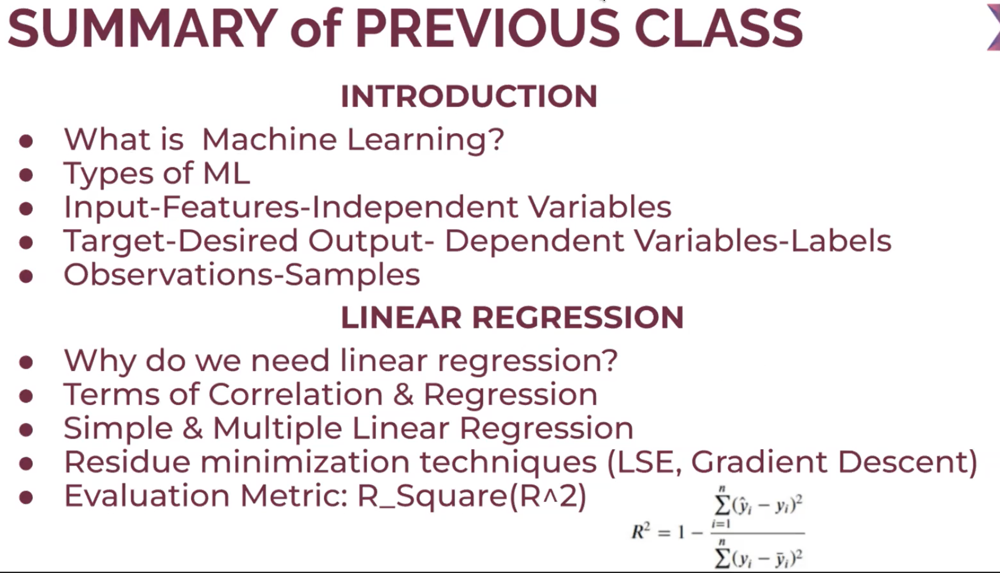

## Residuals 
- toplamlari sifir olmali 
- Residual = Observed value - Predicted value:
- e = y - y^

- dogru best fit noktadan gecer

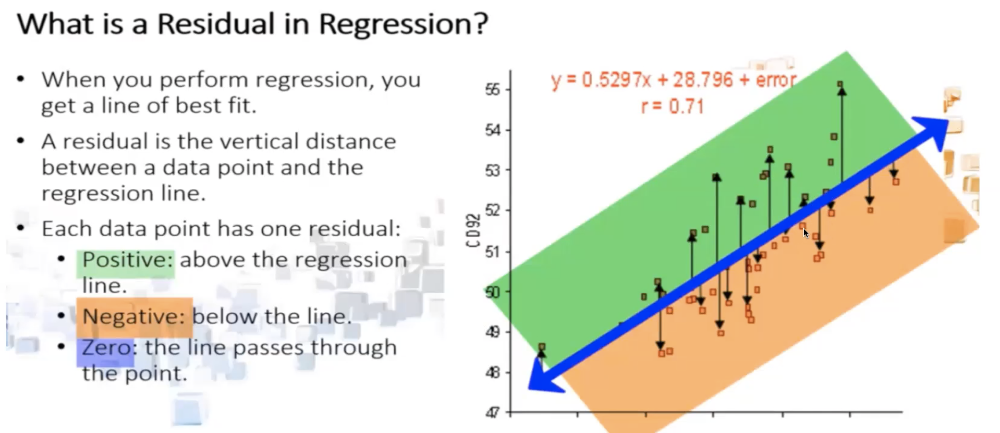

datalarin lineer regressiona uygunlugunu iki sekilde bakariz 
1. input acisindan bakarsak, corrolationa veriler arasinda iliskiye bakariz, lineer bir iliski var mi?  
2. output acisindan, residue bakilir. residual cizimler normal dagilima uygun mu? 

gercek bir lineer regresssion varsa 
- hatalar bagimsiz olur
- normal dagilmistir 

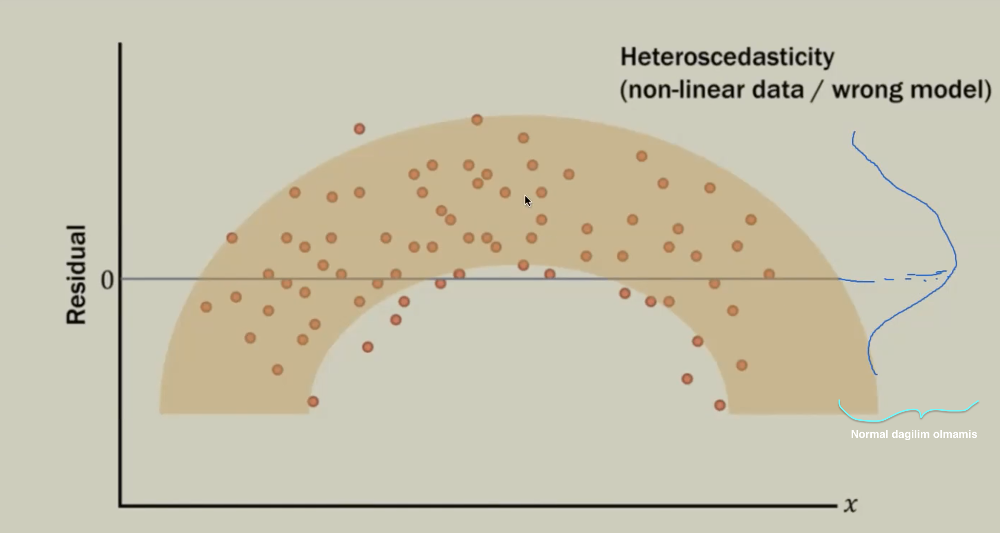

Asagidaki grafik icin normal dagilim uygun

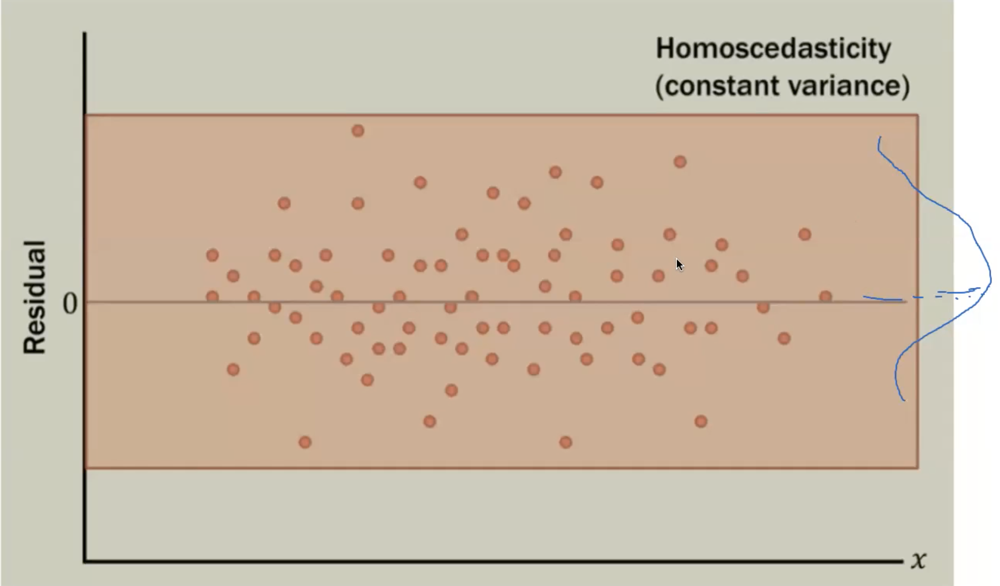

 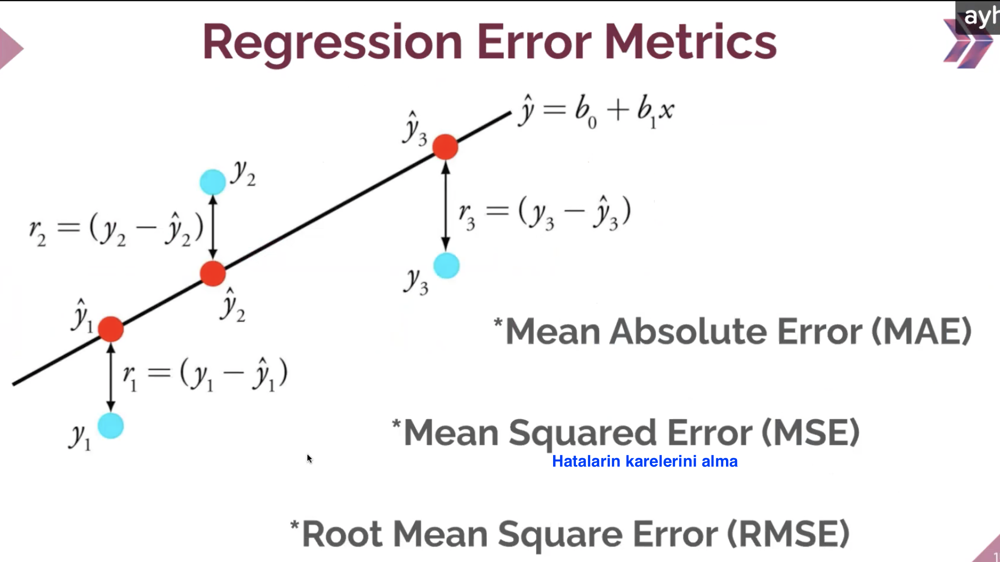

### MAE: absulute difference
- not penalizes error - kusur/kabahatlar cezalandirilmaz 
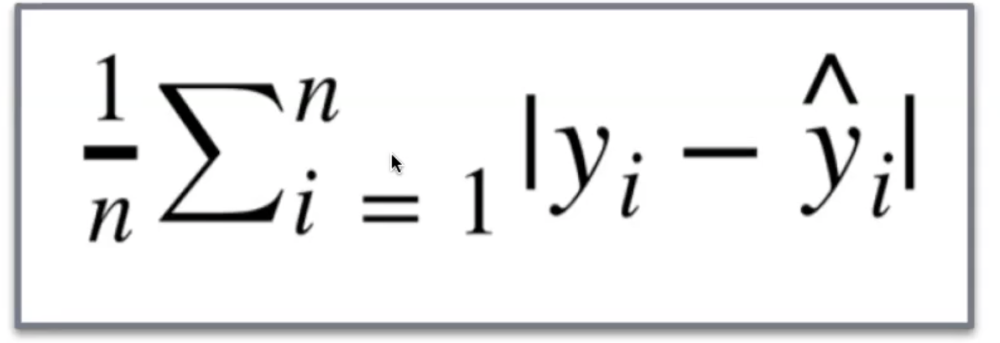

### MSE: mean squared errors
kucuk hatalari bile cezalandirir
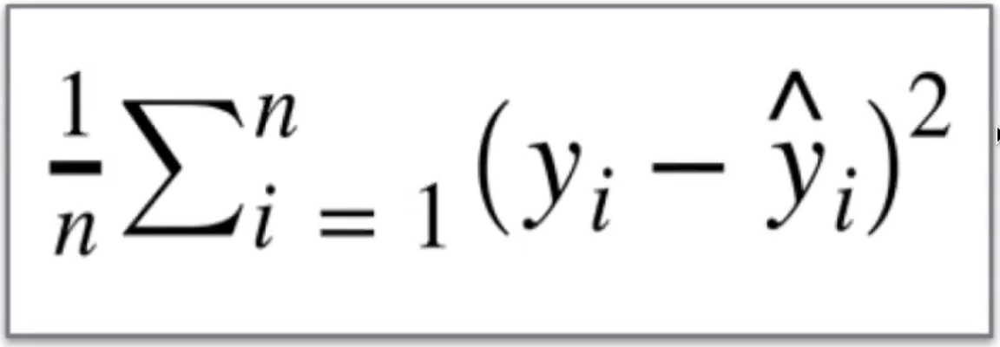

### RMSE: root mean square error
mse yonteminin karesini alir 
- buyuk hatalardan haberdar eder 

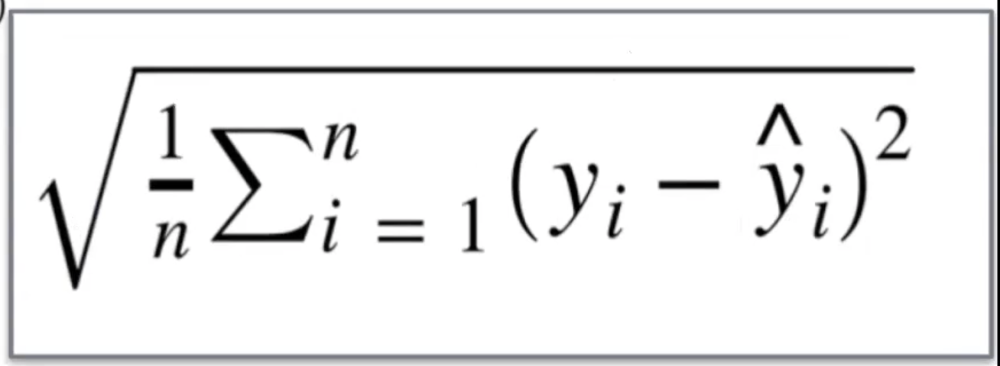

- how to evaluate linear regression models? 
-- error metriklere bakariz (modeli degerlendirdigimiz icin regression error metriklere bakariz ama hangi metrikler?)
-- MAE (mean absulate error), MSE(Mean squared error), RMSE(Root mean squared error)
-- r^2 ye bakariz, regressionun ne kadar tutarli oldugunu gosterir 

- Corr ve residual bakmak lineer regressiona veya nonlineer regressiona ne kadar uygun ona bakmak icin kullanilir

## Scit_learn 
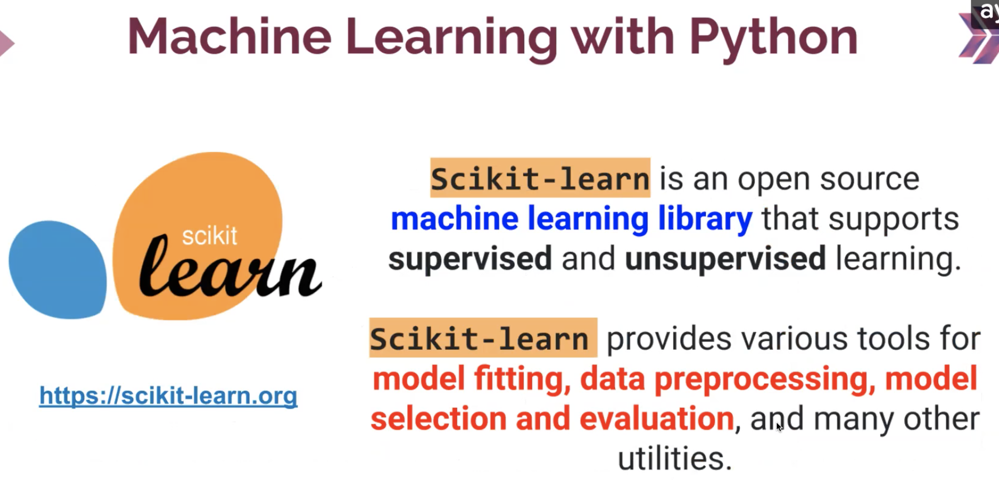

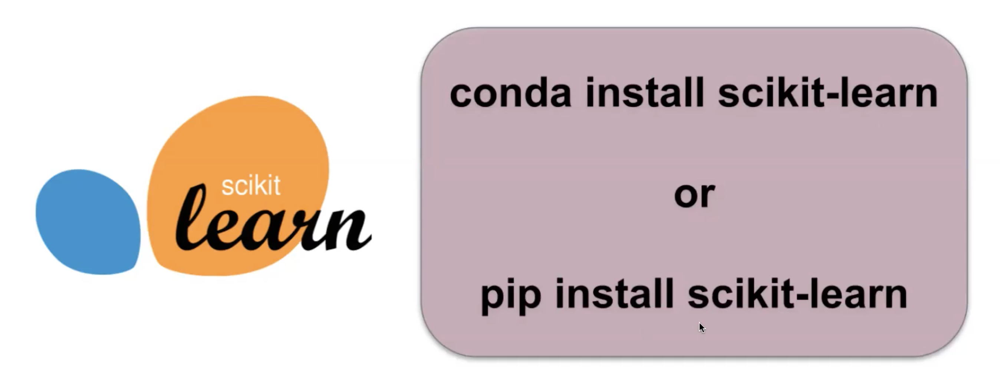

In [3]:
conda install scikit-learn

Solving environment: done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


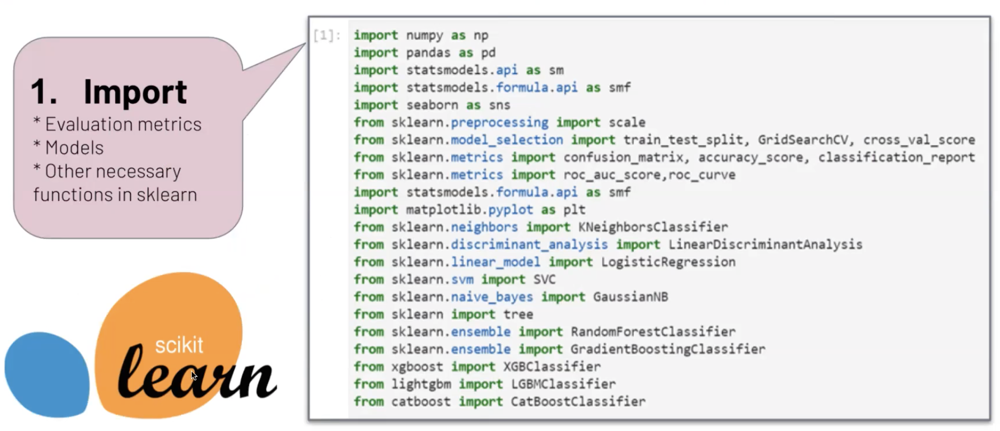

sklearn ve sci-learn ayni sey
- sklearn import etmek icin kutuphanenin ismi 

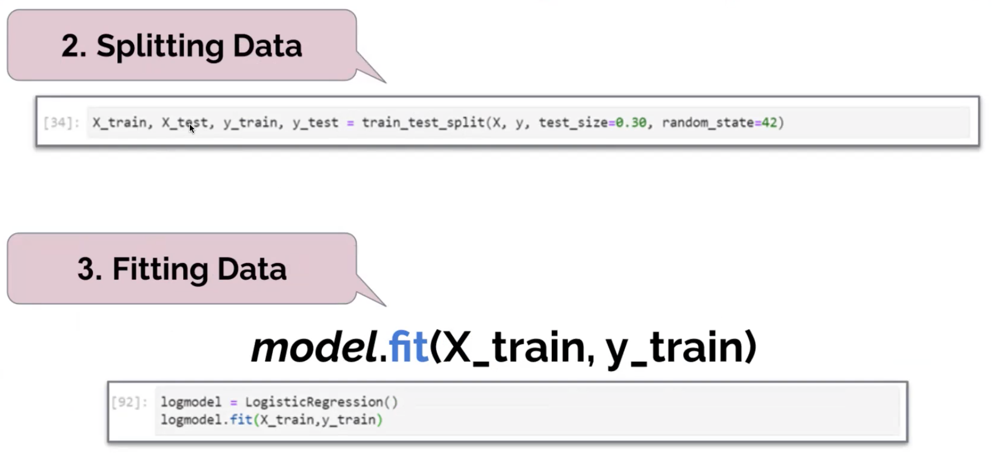

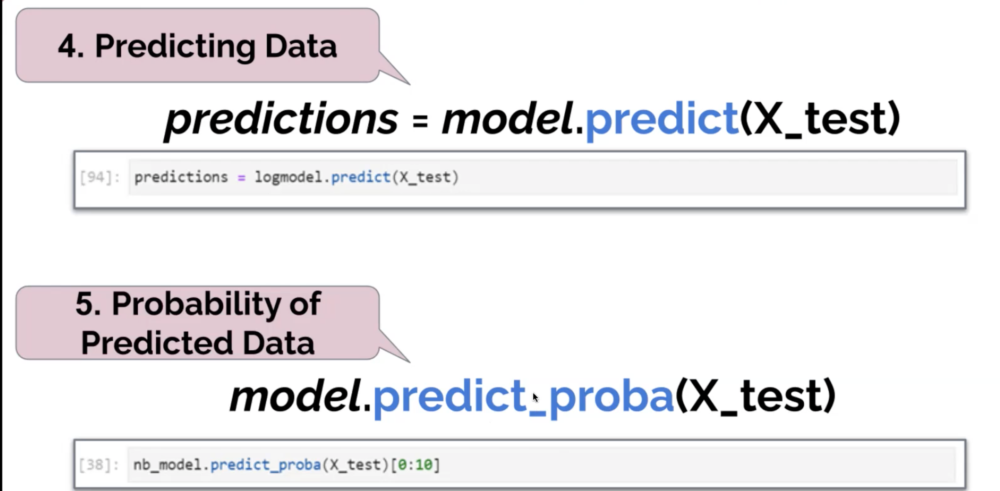

- Predict yaparken 0 ve 1 olarak sonuc verir (0.5 in altındaki değerleri 0'a, üstündekileri 1'e çevirir)
- predict_proba belli orana gore 
* probleminiz classification ise predict_proba ile bir classa ait olma probabbilitysin i verir.
* Probleminz regresyon problemi ise predict_proba yoktur

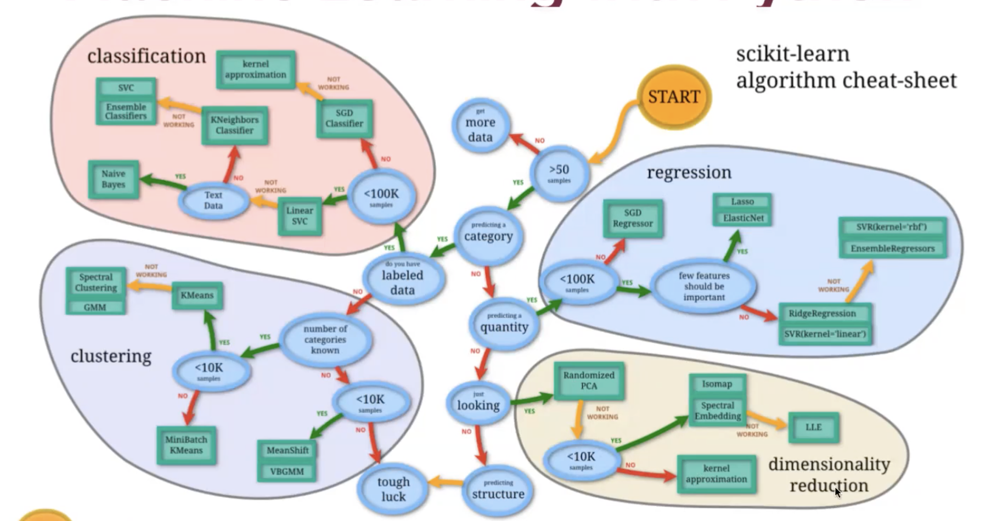

## Multiple Linear Regression and Regression Error Metrics

## Import library

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
plt.rcParams["figure.figsize"] = (10,6)
import warnings
warnings.filterwarnings('ignore')

In [6]:
pip install pyforest

Note: you may need to restart the kernel to use updated packages.


In [7]:
import pyforest

In [8]:
from pyforest import *

In [9]:
lazy_imports()

['import textblob',
 'from sklearn import svm',
 'from sklearn.feature_extraction.text import TfidfVectorizer',
 'from sklearn.preprocessing import RobustScaler',
 'import fastai',
 'import keras',
 'import pandas as pd',
 'import lightgbm as lgb',
 'from dask import dataframe as dd',
 'from sklearn.linear_model import ElasticNetCV',
 'import tqdm',
 'import datetime as dt',
 'import gensim',
 'from sklearn.linear_model import Ridge',
 'from sklearn.feature_extraction.text import CountVectorizer',
 'from sklearn.cluster import KMeans',
 'from sklearn.preprocessing import StandardScaler',
 'from sklearn.linear_model import LinearRegression',
 'import pydot',
 'from sklearn.model_selection import cross_val_score',
 'from sklearn.preprocessing import OneHotEncoder',
 'from statsmodels.tsa.arima_model import ARIMA',
 'import numpy as np',
 'import cv2',
 'import glob',
 'import re',
 'import plotly.graph_objs as go',
 'import awswrangler as wr',
 'import plotly.express as px',
 'from sklea

## Read Dataset

In [10]:
df = pd.read_csv("Advertising.csv")
df

<IPython.core.display.Javascript object>

,TV,radio,newspaper,sales
0,230.1,37.8,69.2,22.1
1,44.5,39.3,45.1,10.4
2,17.2,45.9,69.3,9.3
3,151.5,41.3,58.5,18.5
4,180.8,10.8,58.4,12.9
...,...,...,...,...
195,38.2,3.7,13.8,7.6
196,94.2,4.9,8.1,9.7
197,177.0,9.3,6.4,12.8
198,283.6,42.0,66.2,25.5


## Data Preparation

In [11]:
df.shape

(200, 4)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   TV         200 non-null    float64
 1   radio      200 non-null    float64
 2   newspaper  200 non-null    float64
 3   sales      200 non-null    float64
dtypes: float64(4)
memory usage: 6.4 KB


In [13]:
df.describe()
# outliar tespiti icin kabaca bakiyoruz

,TV,radio,newspaper,sales
count,200.000000,200.000000,200.000000,200.000000
mean,147.042500,23.264000,30.554000,14.022500
std,85.854236,14.846809,21.778621,5.217457
min,0.700000,0.000000,0.300000,1.600000
25%,74.375000,9.975000,12.750000,10.375000
50%,149.750000,22.900000,25.750000,12.900000
75%,218.825000,36.525000,45.100000,17.400000
max,296.400000,49.600000,114.000000,27.000000


###  outliar tespiti  icin ornekler

In [14]:
print(np.mean([100, 110, 120, 115]))
print(np.std([100, 110, 120, 115]))
# verilen degerleri ve sonucu kiyasladigimizda her data mean ve std degerine yakin oldugu gorulur 

<IPython.core.display.Javascript object>

111.25


<IPython.core.display.Javascript object>

7.39509972887452


In [15]:
print(np.mean([100, 110, 120, 700]))
print(np.std([100, 110, 120, 700]))
# ornek degerler icine outlier 700 koyunca cikan sonucu kiyaslarsak 
# cikan sonuc, cogunluk mean veya std degerinden uzaklasir 

<IPython.core.display.Javascript object>

257.5


<IPython.core.display.Javascript object>

255.57533136044253


In [16]:
print(np.mean([100, 110, 120, 900]))
print(np.std([100, 110, 120, 900]))
# cikan sonuc, cogunluk mean veya std degerinden uzaklasir 

<IPython.core.display.Javascript object>

307.5


<IPython.core.display.Javascript object>

342.153109002388


## Distribution of features

<IPython.core.display.Javascript object>

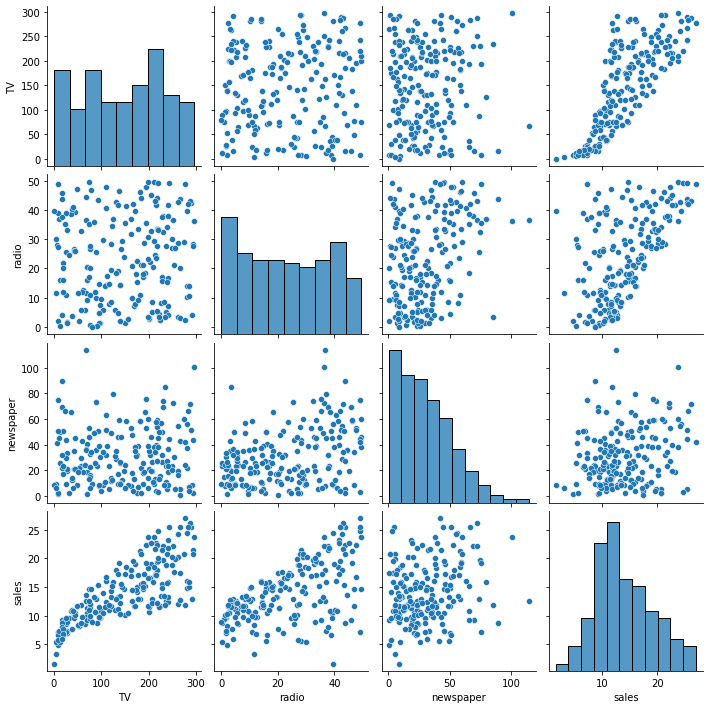

In [17]:
sns.pairplot(df);
# hangisiyle daha cok iliskisi var? 

In [18]:
df.corr()

,TV,radio,newspaper,sales
TV,1.000000,0.054809,0.056648,0.782224
radio,0.054809,1.000000,0.354104,0.576223
newspaper,0.056648,0.354104,1.000000,0.228299
sales,0.782224,0.576223,0.228299,1.000000


<IPython.core.display.Javascript object>

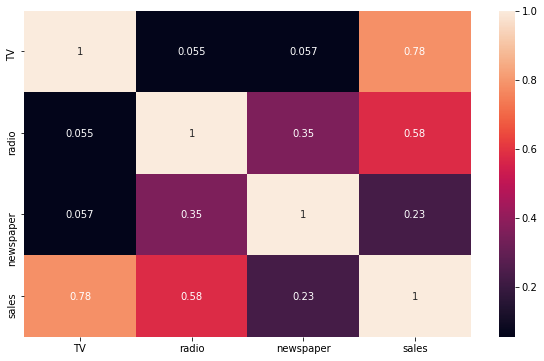

In [19]:
sns.heatmap(df.corr(), annot = True);

## Train-Test Split

In [20]:
# pip install scikit-learn

In [21]:
X = df.drop(columns ="sales") #df[["TV", "radio", "newspaper"]]
y = df["sales"] 

# X neden buyuk: matris 
# y neden kucuk: vektor 
# target ve feature ayirmis olduk

In [23]:
X # features, independent variables

,TV,radio,newspaper
0,230.1,37.8,69.2
1,44.5,39.3,45.1
2,17.2,45.9,69.3
3,151.5,41.3,58.5
4,180.8,10.8,58.4
...,...,...,...
195,38.2,3.7,13.8
196,94.2,4.9,8.1
197,177.0,9.3,6.4
198,283.6,42.0,66.2


In [22]:
y # target

0      22.1
1      10.4
2       9.3
3      18.5
4      12.9
       ... 
195     7.6
196     9.7
197    12.8
198    25.5
199    13.4
Name: sales, Length: 200, dtype: float64

In [24]:
from sklearn.model_selection import train_test_split

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state =42)
# df bir kismini train, bir kismini test olarak kullanmak istiyoruz 
# 4 parcaya bolduk

test size genelde 0.3 - 0.2 olabilir, 
- nadiren data cok kucukse 0.1 yapabiliriz ki train'e data kalsin 
- 0.40 onbinlerce-yuzbinlerce data varsa olabilir 

random state 
- random bir islem var. her calistirdigizda farkli bir deger alip sonuclarim degismesin 
- her seferinde ayni datalari almasi icin random_state ekleriz, 
- 42 olma sebebi (otostopcunun galaksi rehberi) 
(Hayatın anlamını uzun hesaplamalar sonucu 42 bulan süper bilgisayardan esinlenmiş olduğu)

parcalama ornek:
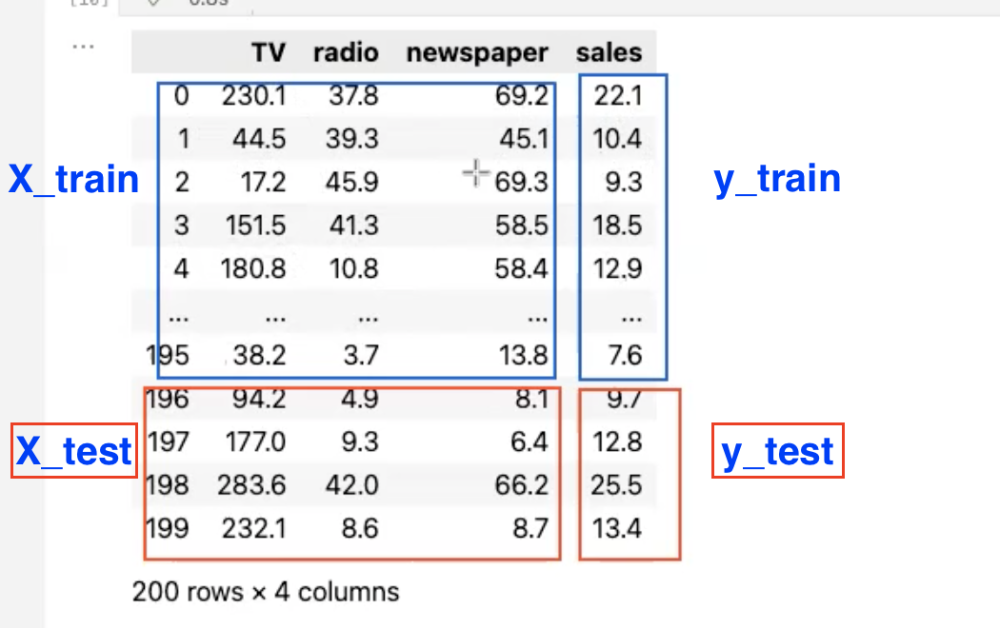

In [25]:
df.sample(15)

,TV,radio,newspaper,sales
57,136.2,19.2,16.6,13.2
102,280.2,10.1,21.4,14.8
186,139.5,2.1,26.6,10.3
141,193.7,35.4,75.6,19.2
151,121.0,8.4,48.7,11.6
101,296.4,36.3,100.9,23.8
2,17.2,45.9,69.3,9.3
47,239.9,41.5,18.5,23.2
183,287.6,43.0,71.8,26.2
68,237.4,27.5,11.0,18.9


In [27]:
print("Train features shape : ", X_train.shape)
print("Train target shape   : ", y_train.shape)
print("Test features shape  : ", X_test.shape)
print("Test target shape    : ", y_test.shape)

Train features shape :  (140, 3)
Train target shape   :  (140,)
Test features shape  :  (60, 3)
Test target shape    :  (60,)


In [28]:
X_train

,TV,radio,newspaper
169,284.3,10.6,6.4
97,184.9,21.0,22.0
31,112.9,17.4,38.6
12,23.8,35.1,65.9
35,290.7,4.1,8.5
...,...,...,...
106,25.0,11.0,29.7
14,204.1,32.9,46.0
92,217.7,33.5,59.0
179,165.6,10.0,17.6


In [28]:
X_test

,TV,radio,newspaper
95,163.3,31.6,52.9
15,195.4,47.7,52.9
30,292.9,28.3,43.2
158,11.7,36.9,45.2
128,220.3,49.0,3.2
115,75.1,35.0,52.7
69,216.8,43.9,27.2
170,50.0,11.6,18.4
174,222.4,3.4,13.1
45,175.1,22.5,31.5


In [29]:
y_train

169    15.0
97     15.5
31     11.9
12      9.2
35     12.8
       ... 
106     7.2
14     19.0
92     19.4
179    12.6
102    14.8
Name: sales, Length: 140, dtype: float64

## Model Fitting and Compare Actual and Predicted Labels

In [29]:
from sklearn.linear_model import LinearRegression

In [30]:
model = LinearRegression()

In [31]:
model.fit(X_train, y_train)

LinearRegression()

In [32]:
X_test.head()
# bu datalar girdiginde ne predict edecegini tek tek hesapladi y_predict oldu 
# giren X satir kadar y sonuc cikti 

,TV,radio,newspaper
95,163.3,31.6,52.9
15,195.4,47.7,52.9
30,292.9,28.3,43.2
158,11.7,36.9,45.2
128,220.3,49.0,3.2


## Predictions

In [33]:
y_pred = model.predict(X_test)
y_pred
# X_test'e gore y_predict yapti 
# elimizde ilaveten y_test var 
# evaluate ederek yapinin nasil calistigina bakacagiz 

array([16.5653963 , 21.18822792, 21.55107058, 10.88923816, 22.20231988,
       13.35556872, 21.19692502,  7.35028523, 13.27547079, 15.12449511,
        9.01443026,  6.52542825, 14.30205991,  8.97026042,  9.45679576,
       12.00454351,  8.91549403, 16.15619251, 10.29582883, 18.72473553,
       19.76821818, 13.77469028, 12.49638908, 21.53501762,  7.60860741,
        5.6119801 , 20.91759483, 11.80627665,  9.08076637,  8.51412012,
       12.17604891,  9.9691939 , 21.73008956, 12.77770578, 18.1011362 ,
       20.07590796, 14.26202556, 20.93826535, 10.83938827,  4.38190607,
        9.51332406, 12.40486324, 10.17045434,  8.09081363, 13.16388427,
        5.2243552 ,  9.28893833, 14.09330719,  8.69024497, 11.66119763,
       15.71848432, 11.63156862, 13.35360735, 11.1531472 ,  6.33636845,
        9.76157954,  9.4195714 , 24.25516546,  7.69519137, 12.15317572])

In [35]:
# istersek X_test'in bir kismini sokabiliriz 
# sadece indexi 95 olani almak istersek 
y_pred2 = model.predict(X_test.loc[[95]])
# y_pred2 = model.predict(X_test.iloc[0:1])

y_pred2
# reset index yapmak gerekebilir cunku X_test random veriler random indexler arasindan secildi
# veya for dongusuyle satirlari inceleyebiliriz 

array([16.5653963])

In [34]:
model.coef_
# lineer oldugu icin formulu biliyoruz 
# her bir featur'un( tv, radio, newspaper) katsayisini gosterir 

array([0.04405928, 0.1992875 , 0.00688245])

In [35]:
model.intercept_

2.7089490925159048

In [38]:
# y_pred = b3 * TV + b2 * radio + b3 * newspaper + b0
# her modelin kendi formulu var
# biz bu formulu bildigimiz icin yazdik 

In [39]:
sum(X_test.loc[95] * model.coef_) + model.intercept_
# formulle de yapsak ayni sonucu elde ederiz 

16.565396297434837

In [36]:
my_dict = {"Actual": y_test, "Pred": y_pred, "Residual":y_test-y_pred}
# test, predict ve residual degerleri olusturduk

In [37]:
comparing = pd.DataFrame(my_dict)
comparing

# residuallarin absoluta alip, hatayi actual ile oranlayip 100 ile carparsak 
# %kac sapma yaptigini hesaplayabiliriz 
# mean absolute percentage error 

<IPython.core.display.Javascript object>

,Actual,Pred,Residual
95,16.9,16.565396,0.334604
15,22.4,21.188228,1.211772
30,21.4,21.551071,-0.151071
158,7.3,10.889238,-3.589238
128,24.7,22.202320,2.497680
115,12.6,13.355569,-0.755569
69,22.3,21.196925,1.103075
170,8.4,7.350285,1.049715
174,11.5,13.275471,-1.775471
45,14.9,15.124495,-0.224495


In [38]:
result_sample = comparing.head(25)
result_sample
# ornek aldik

,Actual,Pred,Residual
95,16.9,16.565396,0.334604
15,22.4,21.188228,1.211772
30,21.4,21.551071,-0.151071
158,7.3,10.889238,-3.589238
128,24.7,22.202320,2.497680
115,12.6,13.355569,-0.755569
69,22.3,21.196925,1.103075
170,8.4,7.350285,1.049715
174,11.5,13.275471,-1.775471
45,14.9,15.124495,-0.224495


<IPython.core.display.Javascript object>

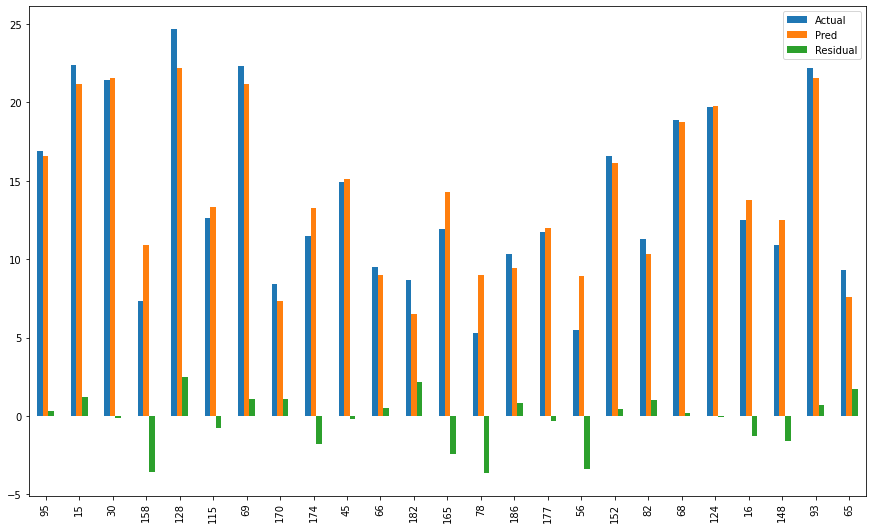

In [39]:
result_sample.plot(kind ="bar", figsize=(15,9))
plt.show()
# grafiksel olarak modelin calismasini inceliyoruz

## Error Metrics

Hatalari anlamlandirmak ve incelemek icin kutuphaneleri indiriyoruz 

In [40]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [41]:
R2_score = r2_score(y_test, y_pred)
R2_score
# testimiz %86 oraninda dogru
# yeteri kadar veri olmadigi icin boyle bir sonuc aldik diyebiliriz 

0.8609466508230368

In [42]:
mae = mean_absolute_error(y_test, y_pred)
mae

1.5116692224549086

In [43]:
mse = mean_squared_error(y_test, y_pred)
mse
# cok kullanmiyoruz 

3.796797236715219

In [44]:
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
rmse
# bir ustteki verinin kokunu aldik, daha cok tercih ediliyor 

<IPython.core.display.Javascript object>

1.9485372043446385

- mae: 1.5116692224549086 (aradaki farkin absolute degeri)
- rmse: 1.9485372043446385 (aradaki farkin karelerinin toplaminin kare koku) 
-- cikan sonuclarin birbirine yakin olmasi, ucuk kacik bir hata yok demek 
-- hatalar arasinda uyum var demek. 
-- birisi 1.5 cikarken oburu 50 cikarsa o zaman anormal durum var, outlier bir deger var diyebilirdik

In [45]:
sales_mean = df["sales"].mean()
sales_mean

14.022500000000003

In [48]:
mae / sales_mean
# %10 hata ile regression yapmis 
# bagil hata 

0.10780311802138766

In [47]:
rmse / sales_mean

0.13895790367941793

## Adjusted R2 score 

https://towardsdatascience.com/demystifying-r-squared-and-adjusted-r-squared-52903c006a60

Genel kultur olarak kalsin
- R2'nin duzenlenmis hali
- Dataframe'in anlamli olmayan featurelari, gereksiz sutunlari olabilir 
- Onemli, kullanabilecegimiz featurelarin tespiti icin kullanilir 
- ilerde feature importance (?) adindan dersimiz var

featurelarin ne kadar makul oldugunu soyler 

p: feature verir

In [51]:
def adj_r2(y_test, y_pred, df):
    r2 = r2_score(y_test, y_pred)
    n = df.shape[0]   # number of observations
    p = df.shape[1]-1 # number of independent variables 
    adj_r2 = 1 - (1-r2)*(n-1)/(n-p-1)
    return adj_r2

In [52]:
adj_r2(y_test, y_pred, df)

0.8588182832335934

## What is the concept of punishment for RMSE error metric?

In [55]:
variables = {
    "Actual": [1000, 2000, 3000, 4000, 5000],
    "pred": [1100, 2200, 3200, 4200, 5500]
}
# %10 hata ile predict etmisiz 

In [56]:
df_2 = pd.DataFrame(variables)
df_2

<IPython.core.display.Javascript object>

,Actual,pred
0,1000,1100
1,2000,2200
2,3000,3200
3,4000,4200
4,5000,5500


In [57]:
df_2["residual"] = abs(df_2.Actual - df_2.pred)

In [58]:
df_2

,Actual,pred,residual
0,1000,1100,100
1,2000,2200,200
2,3000,3200,200
3,4000,4200,200
4,5000,5500,500


In [59]:
#mae
df_2.residual.sum()/5 #200

240.0

In [60]:
#rmse
((df_2.residual**2).sum()/5)**0.5 #209.76

275.68097504180446

 degerler yakin sayilir
- modelde anormallik olsaydi, predict degerde bir degeri 6000 yapsaydik, 
- cikan sonuclar arasindaki fark cok acilacakti 
- (mae 340 - rmse 475 oldu, fark artti, outlier var )

## Evaluation Model

In [62]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    R2_score = r2_score(actual, pred)
    print("Model testing performance:")
    print("--------------------------")
    print(f"R2_score \t: {R2_score}")
    print(f"MAE \t\t: {mae}")
    print(f"MSE \t\t: {mse}")
    print(f"RMSE \t\t: {rmse}")

In [67]:
eval_metric(y_test, y_pred)

<IPython.core.display.Javascript object>

Model testing performance:
--------------------------
R2_score 	: 0.8609466508230368
MAE 		: 1.5116692224549086
MSE 		: 3.796797236715219
RMSE 		: 1.9485372043446385


In [65]:
y_train_pred = model.predict(X_train)

In [66]:
eval_metric(y_train, y_train_pred)
# Train datanin performansi

<IPython.core.display.Javascript object>

Model testing performance:
--------------------------
R2_score 	: 0.9055159502227753
MAE 		: 1.1581502948072528
MSE 		: 2.4793551789057866
RMSE 		: 1.574596830590544


## Is data suitable for linear regression?

https://stats.stackexchange.com/questions/12262/what-if-residuals-are-normally-distributed-but-y-is-not

## Plotting residuals

In [68]:
residuals = y_test-y_pred

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

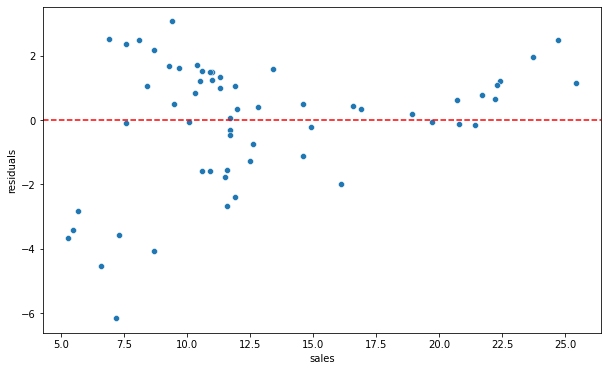

In [69]:
plt.figure(figsize = (10,6))
sns.scatterplot(x = y_test, y = residuals) #-residuals
plt.axhline(y = 0, color ="r", linestyle = "--")
plt.ylabel("residuals")
plt.show()

<IPython.core.display.Javascript object>

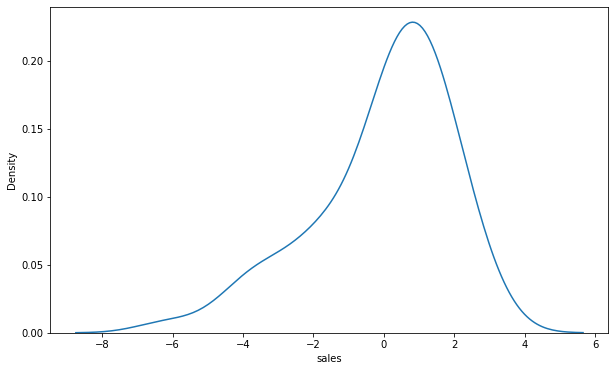

In [70]:
sns.kdeplot(residuals);

In [71]:
pip install yellowbrick

Note: you may need to restart the kernel to use updated packages.


In [72]:
pip install yellowbrick -- user

ERROR: Could not find a version that satisfies the requirement user
ERROR: No matching distribution found for user
Note: you may need to restart the kernel to use updated packages.


In [73]:
from yellowbrick.regressor import ResidualsPlot

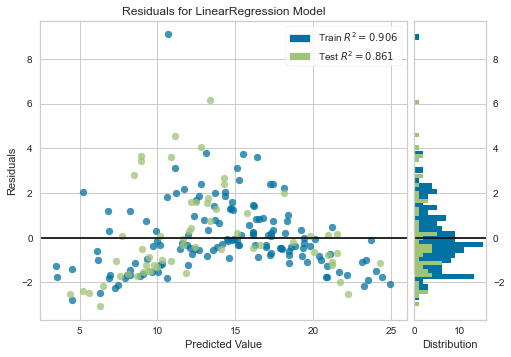

In [74]:
from yellowbrick.regressor import ResidualsPlot

# Instantiate the linear model and visualizer
model = LinearRegression()
visualizer = ResidualsPlot(model)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show();        # Finalize and render the figure

## Prediction Error for LinearRegression

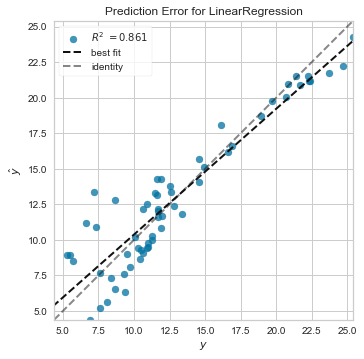

In [75]:
from yellowbrick.regressor import PredictionError
# Instantiate the linear model and visualizer
model = LinearRegression()
visualizer = PredictionError(model)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show();    

koyu ve acik renkli cizgililer arasi mesafe ne kadar iyi bir fit yaptigimizi gosterir
- acik line kutuphanenin predict error, yellow brick'in soyledigi ideal model 
- biz ise koyu renkli kismi bulmusuz. o yuzden aradaki fark hata farkini gosterir 

## Retraining Model on Full Data

In [76]:
final_model = LinearRegression()

In [85]:
final_model.fit(X, y)
# fit'i X_test yapmadik da dogrudan X ile yaptik 

LinearRegression()

## Coefficients

In [80]:
final_model.coef_

array([ 0.04576465,  0.18853002, -0.00103749])

In [81]:
final_model.intercept_

2.9388893694594103

In [82]:
df.head()

,TV,radio,newspaper,sales
0,230.1,37.8,69.2,22.1
1,44.5,39.3,45.1,10.4
2,17.2,45.9,69.3,9.3
3,151.5,41.3,58.5,18.5
4,180.8,10.8,58.4,12.9


In [83]:
coeff_df = pd.DataFrame(final_model.coef_, index = X.columns, columns = ["Coefficient"] )

<IPython.core.display.Javascript object>

In [84]:
coeff_df

,Coefficient
TV,0.045765
radio,0.188530
newspaper,-0.001037


## Prediction on New Data

In [86]:
adv = [[150, 20, 15]]

In [87]:
adv

[[150, 20, 15]]

In [88]:
final_model.predict(adv)

array([13.55862413])

In [89]:
final_model.coef_

array([ 0.04576465,  0.18853002, -0.00103749])

In [90]:
final_model.intercept_

2.9388893694594103

In [91]:
sum(final_model.coef_ * [150, 20, 15]) + final_model.intercept_

13.558624130495994

In [92]:
adv_2 = [[150, 20, 15], [160, 20, 15]]

In [93]:
final_model.predict(adv_2)

array([13.55862413, 14.01627059])

In [95]:
14.01627059 - 13.55862413
# 0.45 kadar artis var, featurelarin sonuca etkisi goruluyor 

0.4576464599999994

## The effect of features on the predicted label

In [96]:
coeff_df

,Coefficient
TV,0.045765
radio,0.188530
newspaper,-0.001037


In [97]:
coeff_df.Coefficient * adv[0]

TV           6.864697
radio        3.770600
newspaper   -0.015562
Name: Coefficient, dtype: float64

### Degerlerin tum sonuca etkisi 

In [101]:
6.864697 / 13.55862413
# TV %50 etkiliyor 

0.5062974630892729

In [99]:
3.770600 / 13.55862413
# radyo %27 etkilemis 

0.2780960637191142

In [100]:
-0.015562 / 13.55862413
# newspaper negatif etkilemis 

-0.0011477565755043907

In [102]:
df.describe()

,TV,radio,newspaper,sales
count,200.000000,200.000000,200.000000,200.000000
mean,147.042500,23.264000,30.554000,14.022500
std,85.854236,14.846809,21.778621,5.217457
min,0.700000,0.000000,0.300000,1.600000
25%,74.375000,9.975000,12.750000,10.375000
50%,149.750000,22.900000,25.750000,12.900000
75%,218.825000,36.525000,45.100000,17.400000
max,296.400000,49.600000,114.000000,27.000000


min-max degerlere bakarsak 
- dengeli olmadigi gorulur. 
- hepsi standardize edilmedigi icin yukarida bulunan sonuclar makul degil
- ornegin degerler 0-1 , 0-3 arasina cekilirse makul dengeli sonuclar elde edilir 